In [1]:
import json
import os
import sys
import itertools
import collections
import nltk; nltk.download('stopwords')
from nltk.corpus import stopwords
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import preprocessing
import numpy as np
#!pip install gensim
from gensim import corpora, models
from gensim.corpora import Dictionary
import gensim
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
#!pip install spacy
import spacy
!python3 -m spacy download en_core_web_sm
import pandas as pd
import random
import networkx as nx

from scipy.spatial.distance import pdist, squareform

import matplotlib.pyplot as plt
#!pip install chart_studio
import chart_studio.plotly as py
import plotly.graph_objects as go
import plotly.express as px
#!pip install pyLDAvis
import pyLDAvis
import pyLDAvis.gensim_models
#!pip install pyLDAvis.gensim
#import pyLDAvis.gensim
#!pip install community
import community
from IPython.display import Image
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/saipavantadikonda/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


     |████████████████████████████████| 13.9 MB 1.2 MB/s eta 0:00:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [2]:
courses_df = pd.read_csv('../data/courses_temp1.csv') 
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment
0,DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science
1,ACC 200,Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting
2,ACC 210,Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting
3,ACC 220,Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting
4,ACC 230,Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting
...,...,...,...,...
7256,ZO 553/FW 553,Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology
7257,ZO 582/ENT 582,Medical and Veterinary Entomology,"The morphology, taxonomy, biology and control ...",Zoology
7258,ZO 790,Special Topics,No description for this course,Zoology
7259,ZO 791,Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology


In [3]:
courses_df.iloc[15].CourseNumber

'ACC 451'

In [4]:
courses_df.iloc[15].CourseTitle

'Internal Auditing'

In [5]:
courses_df.iloc[15].CourseDescription

'An overview of the theory, practice,  and design of internal audit activities. Examine industry standards and  the professional practices of the internal audit. Evaluate risk and controls related to operations, information technology, fraud, and compliance. Design and manage assurance activities. Assess audit evidence and communicate engagement results.'

In [6]:
courses_df.iloc[15].CourseDepartment

'Accounting'

In [7]:
courses_df1 = courses_df

In [8]:
def remove_extraspaces(x):
    return x.strip()
 

In [9]:
courses_df.CourseNumber = courses_df.CourseNumber.apply(remove_extraspaces)
courses_df.CourseTitle = courses_df.CourseTitle.apply(remove_extraspaces)
courses_df.CourseDescription = courses_df.CourseDescription.apply(remove_extraspaces)
courses_df.CourseDepartment = courses_df.CourseDepartment.apply(remove_extraspaces)

In [10]:
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment
0,DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science
1,ACC 200,Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting
2,ACC 210,Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting
3,ACC 220,Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting
4,ACC 230,Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting
...,...,...,...,...
7256,ZO 553/FW 553,Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology
7257,ZO 582/ENT 582,Medical and Veterinary Entomology,"The morphology, taxonomy, biology and control ...",Zoology
7258,ZO 790,Special Topics,No description for this course,Zoology
7259,ZO 791,Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology


In [11]:
courses_df.iloc[15].CourseDepartment

'Accounting'

In [12]:
#courses_df1[courses_df1['CourseNumber']=='ACC\xa0220']

In [13]:
courses_df[['CourseNumber','colisted_cno']] = courses_df['CourseNumber'].str.split('/',1,expand = True)
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,colisted_cno
0,DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,None
1,ACC 200,Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,None
2,ACC 210,Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting,None
3,ACC 220,Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting,None
4,ACC 230,Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting,None
...,...,...,...,...,...
7256,ZO 553,Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology,FW 553
7257,ZO 582,Medical and Veterinary Entomology,"The morphology, taxonomy, biology and control ...",Zoology,ENT 582
7258,ZO 790,Special Topics,No description for this course,Zoology,None
7259,ZO 791,Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology,None


In [14]:
courses_df['colisted_cno'] = courses_df['colisted_cno'].fillna(0)
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,colisted_cno
0,DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,0
1,ACC 200,Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,0
2,ACC 210,Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting,0
3,ACC 220,Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting,0
4,ACC 230,Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting,0
...,...,...,...,...,...
7256,ZO 553,Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology,FW 553
7257,ZO 582,Medical and Veterinary Entomology,"The morphology, taxonomy, biology and control ...",Zoology,ENT 582
7258,ZO 790,Special Topics,No description for this course,Zoology,0
7259,ZO 791,Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology,0


In [15]:
#def cleanup(x):
    #return x.split('/')[0].strip()
#courses_df.CourseNumber= courses_df.CourseNumber.apply(cleanup)

In [16]:
#def cleanup_1(x):
    #return x.split('/')[1].strip()
#courses_df['colisted_cno']= courses_df.CourseNumber.apply(cleanup_1)

In [17]:
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,colisted_cno
0,DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,0
1,ACC 200,Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,0
2,ACC 210,Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting,0
3,ACC 220,Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting,0
4,ACC 230,Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting,0
...,...,...,...,...,...
7256,ZO 553,Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology,FW 553
7257,ZO 582,Medical and Veterinary Entomology,"The morphology, taxonomy, biology and control ...",Zoology,ENT 582
7258,ZO 790,Special Topics,No description for this course,Zoology,0
7259,ZO 791,Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology,0


In [18]:
courses_df['CourseNumber'] = courses_df['CourseNumber'].apply(lambda x: str(x).replace(u'\xa0', u' '))

In [19]:
courses_df[courses_df['CourseNumber']=='ZO 553']

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,colisted_cno
7256,ZO 553,Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology,FW 553


In [20]:
test_df1 = courses_df.groupby(['CourseDepartment']).size().reset_index(name ='count')
test_df1

,CourseDepartment,count
0,Academy of Data Science,1
1,Accounting,46
2,Adult & Higher Education,84
3,Advanced Analytics,8
4,Aerospace Studies,11
...,...,...
191,Visual and Performing Arts and Glob Know,1
192,Visual and Performing Arts and U.S. Div,1
193,"Women's, Gender and Sexuality Studies",42
194,Wood and Paper Science,2


In [21]:
test_df1['count'].max()

228

In [22]:
#fig = px.bar(test_df1, x='CourseDepartment', y='count')
#f1 = fig.to_image(format="png")
#Image(f1)

In [23]:
#courses_df1[courses_df1['CourseDepartment']=='Zoology']

In [24]:
courses_df[['deptcode','cno']] = courses_df['CourseNumber'].str.split(' ',1,expand = True)
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,colisted_cno,deptcode,cno
0,DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,0,DSC,495
1,ACC 200,Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,0,ACC,200
2,ACC 210,Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting,0,ACC,210
3,ACC 220,Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting,0,ACC,220
4,ACC 230,Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting,0,ACC,230
...,...,...,...,...,...,...,...
7256,ZO 553,Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology,FW 553,ZO,553
7257,ZO 582,Medical and Veterinary Entomology,"The morphology, taxonomy, biology and control ...",Zoology,ENT 582,ZO,582
7258,ZO 790,Special Topics,No description for this course,Zoology,0,ZO,790
7259,ZO 791,Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology,0,ZO,791


In [25]:
courses_df.dtypes

CourseNumber         object
CourseTitle          object
CourseDescription    object
CourseDepartment     object
colisted_cno         object
deptcode             object
cno                  object
dtype: object

In [26]:
courses_df.cno = courses_df.cno.str.extract('(\d+)')

In [27]:
courses_df.dtypes

CourseNumber         object
CourseTitle          object
CourseDescription    object
CourseDepartment     object
colisted_cno         object
deptcode             object
cno                  object
dtype: object

In [28]:
def course_level(courses_df):
    if int(courses_df.cno)<500:
        y = 'Undergraduate'
    else: 
        y = 'Graduate'
    return y

In [29]:
courses_df['Course Level']= courses_df.apply(course_level,axis =1)
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,colisted_cno,deptcode,cno,Course Level
0,DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,0,DSC,495,Undergraduate
1,ACC 200,Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,0,ACC,200,Undergraduate
2,ACC 210,Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting,0,ACC,210,Undergraduate
3,ACC 220,Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting,0,ACC,220,Undergraduate
4,ACC 230,Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting,0,ACC,230,Undergraduate
...,...,...,...,...,...,...,...,...
7256,ZO 553,Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology,FW 553,ZO,553,Graduate
7257,ZO 582,Medical and Veterinary Entomology,"The morphology, taxonomy, biology and control ...",Zoology,ENT 582,ZO,582,Graduate
7258,ZO 790,Special Topics,No description for this course,Zoology,0,ZO,790,Graduate
7259,ZO 791,Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology,0,ZO,791,Graduate


In [30]:
courses_df.isnull().sum()

CourseNumber         0
CourseTitle          0
CourseDescription    0
CourseDepartment     0
colisted_cno         0
deptcode             0
cno                  0
Course Level         0
dtype: int64

In [31]:
courses_df.dtypes

CourseNumber         object
CourseTitle          object
CourseDescription    object
CourseDepartment     object
colisted_cno         object
deptcode             object
cno                  object
Course Level         object
dtype: object

In [32]:
test_df2 = courses_df.groupby(['Course Level']).size().reset_index(name ='count')
test_df2

,Course Level,count
0,Graduate,3898
1,Undergraduate,3363


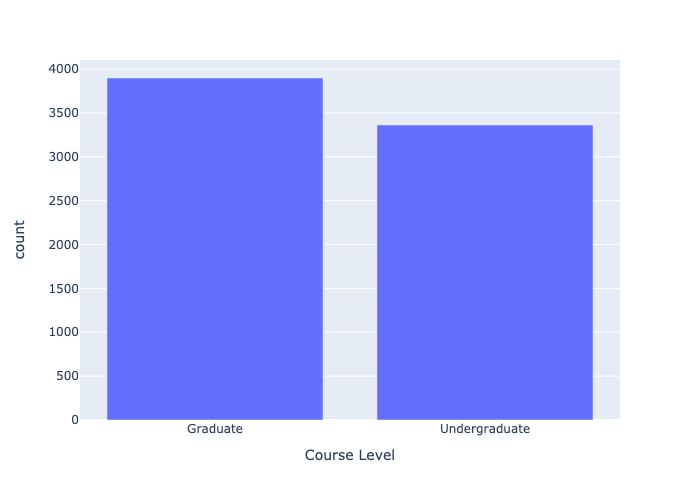

In [33]:
figure1 = px.bar(test_df2, x='Course Level', y='count')
I1 = figure1.to_image(format="png")
Image(I1)

In [34]:
#courses_df2 = pd.read_csv('../data/courses_temp1.csv',sep ='\xa0') 
#courses_df2

In [35]:
#courses_df1[['deptcode']]= courses_df1['CourseNumber'].str.split(' ',0)

In [36]:
repeated_courses = ['Experimental Course','Thesis','Thesis Extension','Dissertation Extension',
             'Independent Study','Dissertation','Independent Doctoral Research', 'Clinical Supervision',
             'Counseling Internship','Directed Doctoral Research','Advanced Counseling Internship',
             'Doctoral Dissertation Research','Research Extension','Directed Research','Internship','Directed Reading','Special Topics']

In [37]:
courses_df2 = courses_df

In [38]:
courses_df2 = courses_df2[~courses_df2['CourseTitle'].str.contains('|'.join(repeated_courses))]
courses_df2

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,colisted_cno,deptcode,cno,Course Level
1,ACC 200,Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,0,ACC,200,Undergraduate
2,ACC 210,Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting,0,ACC,210,Undergraduate
3,ACC 220,Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting,0,ACC,220,Undergraduate
4,ACC 230,Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting,0,ACC,230,Undergraduate
5,ACC 280,Survey of Financial and Managerial Accounting,This course covers the basic principles and co...,Accounting,0,ACC,280,Undergraduate
...,...,...,...,...,...,...,...,...
7254,ZO 524,Comparative Endocrinology,"Basic concepts of endocrinology, including fun...",Zoology,PHY 524/PO 524,ZO,524,Graduate
7255,ZO 542,Herpetology,The biology of the amphibians and reptiles: sy...,Zoology,0,ZO,542,Graduate
7256,ZO 553,Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology,FW 553,ZO,553,Graduate
7257,ZO 582,Medical and Veterinary Entomology,"The morphology, taxonomy, biology and control ...",Zoology,ENT 582,ZO,582,Graduate


In [39]:
courses_df = courses_df.loc[courses_df.CourseTitle.apply(lambda x : type(x) != float and x.strip() not in repeated_courses)]
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,colisted_cno,deptcode,cno,Course Level
0,DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,0,DSC,495,Undergraduate
1,ACC 200,Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,0,ACC,200,Undergraduate
2,ACC 210,Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting,0,ACC,210,Undergraduate
3,ACC 220,Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting,0,ACC,220,Undergraduate
4,ACC 230,Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting,0,ACC,230,Undergraduate
...,...,...,...,...,...,...,...,...
7254,ZO 524,Comparative Endocrinology,"Basic concepts of endocrinology, including fun...",Zoology,PHY 524/PO 524,ZO,524,Graduate
7255,ZO 542,Herpetology,The biology of the amphibians and reptiles: sy...,Zoology,0,ZO,542,Graduate
7256,ZO 553,Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology,FW 553,ZO,553,Graduate
7257,ZO 582,Medical and Veterinary Entomology,"The morphology, taxonomy, biology and control ...",Zoology,ENT 582,ZO,582,Graduate


In [40]:
undergrad_df = courses_df[courses_df['Course Level']== 'Undergraduate']
undergrad_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,colisted_cno,deptcode,cno,Course Level
0,DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,0,DSC,495,Undergraduate
1,ACC 200,Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,0,ACC,200,Undergraduate
2,ACC 210,Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting,0,ACC,210,Undergraduate
3,ACC 220,Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting,0,ACC,220,Undergraduate
4,ACC 230,Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting,0,ACC,230,Undergraduate
...,...,...,...,...,...,...,...,...
7246,ZO 334,Captive Animal Biology Field Laboratory,This laboratory course serves to introduce int...,Zoology,0,ZO,334,Undergraduate
7247,ZO 350,Animal Phylogeny and Diversity,Phylogenetic history and adaptive radiation of...,Zoology,0,ZO,350,Undergraduate
7248,ZO 402,Invertebrate Biology,"Over 90% of all animals are invertebrates, and...",Zoology,0,ZO,402,Undergraduate
7249,ZO 410,Introduction to Animal Behavior,Studies in animal behavior in vertebrates and ...,Zoology,0,ZO,410,Undergraduate


In [41]:
graduate_df = courses_df[courses_df['Course Level']== 'Graduate']
graduate_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,colisted_cno,deptcode,cno,Course Level
22,ACC 508,Advanced Commercial Law,A study of law and regulation as a structure i...,Accounting,0,ACC,508,Graduate
23,ACC 510,Advanced Financial Accounting,Study of complex financial reporting topics af...,Accounting,0,ACC,510,Graduate
24,ACC 519,Applied Financial Management,A study of key business decision made and tool...,Accounting,0,ACC,519,Graduate
25,ACC 520,Advanced Management Accounting,A study of how accounting and operating inform...,Accounting,0,ACC,520,Graduate
26,ACC 530,Advanced Income Tax,"A study of the tax consequences of business, f...",Accounting,0,ACC,530,Graduate
...,...,...,...,...,...,...,...,...
7254,ZO 524,Comparative Endocrinology,"Basic concepts of endocrinology, including fun...",Zoology,PHY 524/PO 524,ZO,524,Graduate
7255,ZO 542,Herpetology,The biology of the amphibians and reptiles: sy...,Zoology,0,ZO,542,Graduate
7256,ZO 553,Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology,FW 553,ZO,553,Graduate
7257,ZO 582,Medical and Veterinary Entomology,"The morphology, taxonomy, biology and control ...",Zoology,ENT 582,ZO,582,Graduate


In [42]:
def desc_to_words(description):
    final =[]
    for sent in description:
        words = gensim.utils.simple_preprocess(str(sent), deacc=True) 
        final.append(words) 
    return final
data = (courses_df['CourseDescription']) 
data_words = (desc_to_words(data))
print(data_words)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [43]:
stop_words = stopwords.words('english')
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [44]:
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) 
trigram = gensim.models.Phrases(bigram[data_words], threshold=100) 

In [45]:
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [46]:
def remove_stopwords(texts):
    final1 = []
    for doc in texts:
        final = []
        for word in simple_preprocess(str(doc)):
            if word not in stop_words:
                final.append(word)
        final1.append(final)
    return(final1)

In [47]:
data_words_nostops = remove_stopwords(data_words)
print(data_words_nostops)

[['offered', 'needed', 'present', 'material', 'normally', 'available', 'regular', 'departmental', 'course', 'offerings', 'offering', 'new', 'courses', 'trial', 'basis', 'students', 'may', 'repeat', 'course', 'different', 'topic'], ['analysis', 'accounting', 'data', 'useful', 'managerial', 'decision', 'making', 'control', 'evaluation', 'decisions', 'made', 'within', 'business', 'organizations', 'introduction', 'basic', 'models', 'financial', 'statement', 'analysis', 'cost', 'behavior', 'analysis', 'cost', 'control', 'procedures'], ['financial', 'reporting', 'concepts', 'accounting', 'information', 'generating', 'process', 'reporting', 'practices', 'financial', 'statement', 'preparation', 'interpretation', 'analysis', 'financial', 'statements', 'basic', 'accounting', 'principles', 'concepts', 'accounting', 'cycle', 'income', 'measurement', 'internal', 'controls'], ['course', 'designed', 'provide', 'students', 'basic', 'understanding', 'managerial', 'accounting', 'concepts', 'students', '

In [48]:
def bigrams(texts):
    x = []
    for doc in texts:
        x.append(bigram_mod[doc])
    return x

In [49]:
data_words_bigrams = bigrams(data_words_nostops)
print(data_words_bigrams)

[['offered', 'needed', 'present', 'material', 'normally_available', 'regular', 'departmental', 'course', 'offerings', 'offering', 'new', 'courses', 'trial_basis', 'students', 'may', 'repeat', 'course', 'different', 'topic'], ['analysis', 'accounting', 'data', 'useful', 'managerial', 'decision_making', 'control', 'evaluation', 'decisions', 'made', 'within', 'business', 'organizations', 'introduction', 'basic', 'models', 'financial', 'statement', 'analysis', 'cost', 'behavior', 'analysis', 'cost', 'control', 'procedures'], ['financial', 'reporting', 'concepts', 'accounting', 'information', 'generating', 'process', 'reporting', 'practices', 'financial', 'statement', 'preparation', 'interpretation', 'analysis', 'financial_statements', 'basic', 'accounting', 'principles', 'concepts', 'accounting', 'cycle', 'income', 'measurement', 'internal', 'controls'], ['course', 'designed', 'provide', 'students', 'basic', 'understanding', 'managerial', 'accounting', 'concepts', 'students', 'analyze', 'a

In [50]:
def trigrams(texts):
    x = []
    for doc in texts:
        x.append(trigram_mod[bigram_mod[doc]])
    return x

In [51]:
data_words_trigrams = trigrams(data_words_bigrams)
print(data_words_trigrams)

[['offered', 'needed', 'present', 'material', 'normally_available', 'regular', 'departmental', 'course', 'offerings', 'offering', 'new', 'courses', 'trial_basis', 'students', 'may', 'repeat', 'course', 'different', 'topic'], ['analysis', 'accounting', 'data', 'useful', 'managerial', 'decision_making', 'control', 'evaluation', 'decisions', 'made', 'within', 'business', 'organizations', 'introduction', 'basic', 'models', 'financial', 'statement', 'analysis', 'cost', 'behavior', 'analysis', 'cost', 'control', 'procedures'], ['financial', 'reporting', 'concepts', 'accounting', 'information', 'generating', 'process', 'reporting', 'practices', 'financial', 'statement', 'preparation', 'interpretation', 'analysis', 'financial_statements', 'basic', 'accounting', 'principles', 'concepts', 'accounting', 'cycle', 'income', 'measurement', 'internal', 'controls'], ['course', 'designed', 'provide', 'students', 'basic', 'understanding', 'managerial', 'accounting', 'concepts', 'students', 'analyze', 'a

In [52]:
def lemmatization(texts,allowed_postags = ['NOUN','ADJ','VERB','ADV']):
    nlp = spacy.load('en_core_web_sm', disable =['parser','ner'])
    texts_final = []
    for sent in texts:
        texts_final1 = []
        doc = nlp(" ".join(sent))
        for token in doc:
            if token.pos_ in allowed_postags:
                texts_final1.append(token.lemma_)
        texts_final.append(texts_final1)
        
    return texts_final
    

In [53]:
data_lemmatized = lemmatization(data_words_trigrams, allowed_postags = ['NOUN','ADJ','VERB','ADV'])
print(data_lemmatized)

[['offer', 'need', 'present', 'material', 'normally_available', 'regular', 'departmental', 'course', 'offering', 'offer', 'new', 'course', 'trial_basis', 'student', 'repeat', 'course', 'different', 'topic'], ['analysis', 'accounting', 'datum', 'useful', 'managerial', 'decision_make', 'control', 'evaluation', 'decision', 'make', 'business', 'organization', 'introduction', 'basic', 'model', 'financial', 'statement', 'analysis', 'cost', 'behavior', 'analysis', 'cost', 'control', 'procedure'], ['financial', 'reporting', 'concept', 'accounting', 'information', 'generating', 'process', 'report', 'practice', 'financial', 'statement', 'preparation', 'interpretation', 'analysis', 'financial_statement', 'basic', 'accounting', 'principle', 'concept', 'accounting', 'cycle', 'income', 'measurement', 'internal', 'control'], ['course', 'design', 'provide', 'student', 'basic', 'understand', 'managerial', 'accounting', 'concept', 'student', 'analyze', 'accounting', 'datum', 'useful', 'managerial', 'dec

In [54]:
#def lemmatization1(data_words, stop_words= stop_words, allowed_postags = ['NOUN','ADJ','VERB','ADV']):
   # nlp = spacy.load('en_core_web_sm', disable =['parser','ner'])
    #text_out = []
   # for words in data:
    #    doc = nlp((words))
       # new_word =[]
       # for token in doc:
            #if token.pos_ in allowed_postags:
                #new_word.append(token.lemma_)
        #final = ' '.join(new_word)
        #text_out.append(final)
    #return text_out

#lemmatization_words = lemmatization(data_words)
#print(lemmatization_words)
#len(lemmatization_words)

In [55]:
id2word = corpora.Dictionary(data_lemmatized) #gives key words of the data_lemmatized
#print(id2word)
corpus = []

for words in data_lemmatized:
    new = id2word.doc2bow(words)    #bag of words
    corpus.append(new)
print(corpus)

[[(0, 3), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 2), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1)], [(15, 1), (16, 3), (17, 1), (18, 1), (19, 1), (20, 2), (21, 2), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1)], [(15, 3), (16, 1), (17, 1), (20, 1), (26, 2), (33, 1), (35, 2), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1)], [(0, 1), (12, 2), (15, 2), (17, 1), (19, 1), (20, 1), (22, 1), (23, 1), (24, 1), (25, 1), (28, 1), (29, 2), (31, 1), (34, 1), (35, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 1), (55, 1)], [(0, 2), (12, 2), (19, 1), (35, 1), (39, 1), (56, 1), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1), (72, 1), (73, 2), (74, 1)], [(0, 1), (12, 1), (15, 3), (17, 2), (19, 1), (20, 1), (25, 1), (26, 2), (29, 1), (31, 1), (3

In [56]:
len(corpus)

7142

In [57]:
# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=id2word, num_topics=20, random_state=100,
                chunksize=100, passes=10, update_every = 1)

In [58]:
lda_model.print_topics()

[(0,
  '0.138*"student" + 0.059*"course" + 0.052*"year" + 0.045*"enrol" + 0.044*"department" + 0.034*"complete" + 0.030*"university" + 0.028*"content" + 0.027*"result" + 0.025*"credit"'),
 (1,
  '0.136*"science" + 0.123*"student" + 0.080*"requirement" + 0.070*"complete" + 0.068*"write" + 0.066*"program" + 0.036*"need" + 0.033*"measurement" + 0.026*"report" + 0.025*"integrate"'),
 (2,
  '0.085*"course" + 0.060*"evaluation" + 0.059*"project" + 0.057*"offer" + 0.044*"procedure" + 0.043*"interpretation" + 0.043*"level" + 0.039*"take" + 0.037*"presentation" + 0.036*"present"'),
 (3,
  '0.087*"examination" + 0.085*"historical" + 0.080*"relationship" + 0.078*"special" + 0.061*"contemporary" + 0.054*"education" + 0.037*"major" + 0.037*"issue" + 0.031*"consideration" + 0.028*"attention"'),
 (4,
  '0.168*"engineering" + 0.166*"function" + 0.165*"public" + 0.059*"subject" + 0.040*"private" + 0.029*"resource" + 0.027*"regulation" + 0.022*"range" + 0.011*"inventory" + 0.009*"extension"'),
 (5,
  '0

In [59]:
print('Perplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model,corpus= corpus,texts=data_lemmatized, dictionary=id2word,coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Perplexity:  -15.865469644232423
Coherence Score:  0.3872244579338788


In [60]:
def coherences(dictionary, corpus, texts, limit, start, step):
    coherence_values = []
    model_list = []
    n_topics = []
    perplexity_values = []
    for num_topics1 in range(start, limit, step):
        lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=id2word, num_topics=num_topics1, random_state=100,
                chunksize=100, passes=10, update_every = 1)
        model_list.append(lda_model)
        perplexity_values.append(lda_model.log_perplexity(corpus))
        n_topics.append(num_topics1)
        coherencemodel = CoherenceModel(model=lda_model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values,n_topics, perplexity_values

In [61]:
model_list, coherence_values,n_topics, perplexity_values = coherences(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=5, limit=40, step=5)



In [62]:
df1= pd.DataFrame(coherence_values, columns=['Coherence'])
df2= pd.DataFrame(perplexity_values, columns=['Perplexity'])

In [63]:
normalized_df1=(df1-df1.min())/(df1.max()-df1.min())
normalized_df2=(df2-df2.min())/(df2.max()-df2.min())

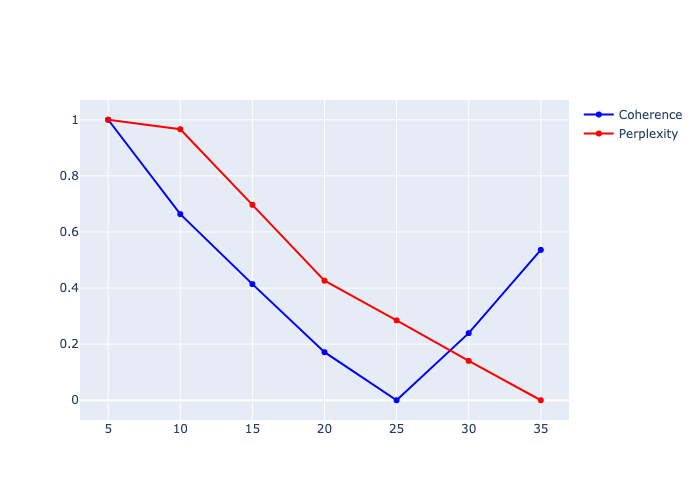

In [64]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=n_topics, y=normalized_df1['Coherence'], name='Coherence',
                         line=dict(color='blue')))

fig.add_trace(go.Scatter(x=n_topics, y=normalized_df2['Perplexity'], name='Perplexity',
                         line=dict(color='red')))

fig.show()


img = fig.to_image(format="png")
Image(img)

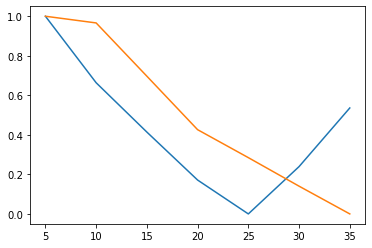

In [65]:
x = range(5, 40, 5)
plt.figure()
plt.plot(x, normalized_df1['Coherence'])
plt.plot(x,normalized_df2['Perplexity'])
plt.show()

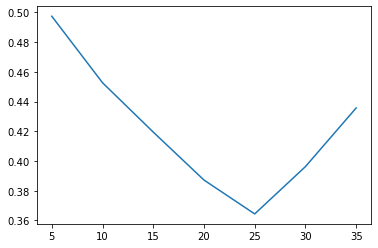

In [66]:
x = range(5, 40, 5)
plt.figure()
plt.plot(x,coherence_values)
plt.show()

In [67]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=id2word, num_topics=29, random_state=100,
                chunksize=100, passes=10, update_every = 1)

In [68]:
print('Perplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model,corpus= corpus,texts=data_lemmatized, dictionary=id2word,coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Perplexity:  -19.537914806833733
Coherence Score:  0.39411959273900793


In [69]:
LDAtopics = lda_model.show_topics(num_topics=29,formatted=False)

In [70]:
LDAtopics

[(0,
  [('scape', 0.0001026905),
   ('focuse', 0.0001026905),
   ('jewish', 0.0001026905),
   ('nazism', 0.0001026905),
   ('terrorism', 0.0001026905),
   ('frisch', 0.0001026905),
   ('rilke', 0.0001026905),
   ('fifteenth', 0.0001026905),
   ('germany', 0.0001026905),
   ('faust', 0.0001026905)]),
 (1,
  [('social', 0.10417986),
   ('science', 0.051580615),
   ('current', 0.049543224),
   ('technology', 0.047012568),
   ('issue', 0.04065785),
   ('historical', 0.040214896),
   ('development', 0.039504927),
   ('topic', 0.03857153),
   ('education', 0.03847577),
   ('include', 0.03546852)]),
 (2,
  [('project', 0.15705526),
   ('level', 0.09802277),
   ('require', 0.083053395),
   ('take', 0.071936384),
   ('presentation', 0.05737574),
   ('review', 0.05456949),
   ('measure', 0.04051757),
   ('plan', 0.03979415),
   ('way', 0.03876935),
   ('multiple', 0.03080141)]),
 (3,
  [('study', 0.29500094),
   ('topic', 0.16919792),
   ('method', 0.16765636),
   ('literature', 0.06879454),
   

In [71]:
pyLDAvis.enable_notebook()

In [72]:
pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds='mmds')

/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in fav

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
11    -0.124016 -0.352131       1        1  8.706494
1      0.137612  0.469926       2        1  8.040921
22     0.323813 -0.315950       3        1  7.565950
8     -0.478381  0.005170       4        1  7.082455
28     0.223526 -0.407961       5        1  5.445645
23     0.389951  0.080379       6        1  4.969427
27     0.420951 -0.204843       7        1  4.655919
17     0.492398  0.050141       8        1  4.634266
14     0.109883 -0.429401       9        1  4.626585
16    -0.194164  0.451740      10        1  4.491785
5      0.374712  0.269433      11        1  3.749909
25    -0.151867 -0.463019      12        1  3.609561
20    -0.447084 -0.119977      13        1  2.873852
10    -0.383910  0.097508      14        1  2.753442
2     -0.232119 -0.296804      15        1  2.655788
7     -0.376507 -0.246806      16        1  2.640457
3      0.117847 -0.256749      17        1  2.460068
21     0.256083  0.380788      18        1  2.324776
4      0.311953 -0.089215      19        1  2.213662
6     -0.037429 -0.142830      20        1  2.163587
15    -0.358884  0.228737      21        1  2.158484
9     -0.290930 -0.045103      22        1  2.054369
12    -0.238287  0.292597      23        1  1.700043
18     0.043503  0.245928      24        1  1.473002
19    -0.138306  0.170336      25        1  1.406017
26    -0.032442  0.389921      26        1  1.289778
13     0.123437  0.003809      27        1  1.052659
24     0.168193  0.164444      28        1  0.989768
0     -0.009533  0.069932      29        1  0.211330, topic_info=             Term         Freq        Total Category  logprob  loglift
0          course  5500.000000  5500.000000  Default  30.0000  30.0000
12        student  6367.000000  6367.000000  Default  29.0000  29.0000
53         design  2976.000000  2976.000000  Default  28.0000  28.0000
69       research  2130.000000  2130.000000  Default  27.0000  27.0000
308         study  1823.000000  1823.000000  Default  26.0000  26.0000
..            ...          ...          ...      ...      ...      ...
25     evaluation     0.042529   660.082112  Topic29  -9.1838  -3.4904
26      financial     0.042529   171.487149  Topic29  -9.1838  -2.1426
27   introduction     0.042529  1014.863805  Topic29  -9.1838  -3.9206
28           make     0.042529   316.449609  Topic29  -9.1838  -2.7552
29     managerial     0.042529    23.427588  Topic29  -9.1838  -0.1520

[1110 rows x 6 columns], token_table=      Topic      Freq          Term
term                               
764       5  0.992409       ability
501      20  0.981371          able
141       1  0.975716        access
461       3  0.963783       account
15        3  0.963285    accounting
...     ...       ...           ...
159      22  0.900738          work
754      22  0.988116  work_specify
684      21  0.939223     workplace
553      14  0.996771         write
389      27  0.995989          year

[781 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[12, 2, 23, 9, 29, 24, 28, 18, 15, 17, 6, 26, 21, 11, 3, 8, 4, 22, 5, 7, 16, 10, 13, 19, 20, 27, 14, 25, 1])

In [73]:
def format_topics_sentences1(ldamodel, corpus, texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        print('i',i)
        print('Row list',row_list)
        row = row_list[0] if ldamodel.per_word_topics else row_list 
        print('Before sort',row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        print('Row after sorted',row)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            print('j',j)
        #     if j == 0:  # => dominant topic
            wp = ldamodel.show_topic(topic_num)
            print('wp',wp)
            topic_keywords = ", ".join([word for word, prop in wp])
            sent_topics_df = sent_topics_df.append(pd.Series([int(i), data_lemmatized[i], int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            # else:
            #     break
    sent_topics_df.columns = ['Document_no','Document_Text','Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    # contents = pd.Series(texts)
    # sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords1 = format_topics_sentences1(ldamodel=lda_model, corpus=corpus[:5], texts=data_lemmatized)

i 0
Row list [(11, 0.123316616), (12, 0.56452745), (21, 0.10707563), (26, 0.15970768)]
Before sort [(11, 0.123316616), (12, 0.56452745), (21, 0.10707563), (26, 0.15970768)]
Row after sorted [(12, 0.56452745), (26, 0.15970768), (11, 0.123316616), (21, 0.10707563)]
j 0
wp [('material', 0.27530196), ('course', 0.24305), ('offer', 0.1246822), ('new', 0.113986254), ('offering', 0.038152527), ('regular', 0.02968278), ('normally_available', 0.01695476), ('presentation', 0.013740889), ('trial_basis', 0.011422974), ('textile', 1.3673091e-05)]
j 1
wp [('group', 0.22374853), ('need', 0.17852263), ('present', 0.16695097), ('small', 0.13185039), ('learning', 0.06288941), ('educational', 0.03802424), ('departmental', 0.013372219), ('animal', 1.8974606e-05), ('surgery', 1.89746e-05), ('hour', 1.89746e-05)]
j 2
wp [('course', 0.15310837), ('student', 0.09479775), ('topic', 0.037535444), ('focus', 0.03162828), ('explore', 0.031241817), ('opportunity', 0.028902216), ('require', 0.028128652), ('service',

i 4
Row list [(5, 0.047684107), (6, 0.12634104), (7, 0.06219992), (8, 0.1868853), (11, 0.14210239), (15, 0.045661625), (25, 0.12644523), (27, 0.23250334)]
Before sort [(5, 0.047684107), (6, 0.12634104), (7, 0.06219992), (8, 0.1868853), (11, 0.14210239), (15, 0.045661625), (25, 0.12644523), (27, 0.23250334)]
Row after sorted [(27, 0.23250334), (8, 0.1868853), (11, 0.14210239), (25, 0.12644523), (6, 0.12634104), (7, 0.06219992), (5, 0.047684107), (15, 0.045661625)]
j 0
wp [('property', 0.1086632), ('credit', 0.10479823), ('principle', 0.079905815), ('plant', 0.06276407), ('include', 0.052060045), ('fundamental', 0.05050938), ('performance', 0.048832025), ('set', 0.039779034), ('allow', 0.036293633), ('example', 0.030517722)]
j 1
wp [('student', 0.16925643), ('course', 0.12341447), ('skill', 0.07455928), ('provide', 0.06897758), ('class', 0.06336415), ('experience', 0.057147056), ('practice', 0.052039094), ('learn', 0.05085707), ('knowledge', 0.034474656), ('develop', 0.028572777)]
j 2
wp

In [74]:
def courses_topic_similarity(ldamodel, corpus, texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        
        
        row = row_list[0] if ldamodel.per_word_topics else row_list 
        
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            
        #     if j == 0:  # => dominant topic
            wp = ldamodel.show_topic(topic_num)
            
            topic_keywords = ", ".join([word for word, prop in wp])
            sent_topics_df = sent_topics_df.append(pd.Series([int(i), data_lemmatized[i], int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            # else:
            #     break
    sent_topics_df.columns = ['Document_no','Document_Text','Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    # contents = pd.Series(texts)
    # sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = courses_topic_similarity(ldamodel=lda_model, corpus=corpus, texts=data_lemmatized)

In [75]:
df_topic_sents_keywords

,Document_no,Document_Text,Topic,Perc_Contribution,Topic_Keywords
0,0,"[offer, need, present, material, normally_avai...",12,0.5646,"material, course, offer, new, offering, regula..."
1,0,"[offer, need, present, material, normally_avai...",26,0.1597,"group, need, present, small, learning, educati..."
2,0,"[offer, need, present, material, normally_avai...",11,0.1233,"course, student, topic, focus, explore, opport..."
3,0,"[offer, need, present, material, normally_avai...",21,0.1071,"management, behavior, different, manage, meet,..."
4,1,"[analysis, accounting, datum, useful, manageri...",28,0.3397,"model, analysis, datum, use, method, problem, ..."
...,...,...,...,...,...
58851,7141,"[intensive, examination, select, aspect, anima...",21,0.1850,"management, behavior, different, manage, meet,..."
58852,7141,"[intensive, examination, select, aspect, anima...",3,0.0940,"study, topic, method, literature, use, quantit..."
58853,7141,"[intensive, examination, select, aspect, anima...",27,0.0940,"property, credit, principle, plant, include, f..."
58854,7141,"[intensive, examination, select, aspect, anima...",17,0.0940,"impact, human, policy, change, assessment, pro..."


In [76]:
df_topic_sents_keywords.dtypes

Document_no            int64
Document_Text         object
Topic                  int64
Perc_Contribution    float32
Topic_Keywords        object
dtype: object

In [77]:
df_topic_sents_keywords['Document_no'] = df_topic_sents_keywords['Document_no'].apply(lambda x : str(int(x)))

In [78]:
df_topic_sents_keywords.dtypes

Document_no           object
Document_Text         object
Topic                  int64
Perc_Contribution    float32
Topic_Keywords        object
dtype: object

In [79]:
courses_df_final = courses_df
courses_df_final.reset_index(inplace = True)

In [80]:
courses_df_final['Document_no'] = courses_df_final.index
courses_df_final['Document_no'] = courses_df_final['Document_no'].apply(lambda x : str(int(x)))

In [81]:
courses_df_final.dtypes

index                 int64
CourseNumber         object
CourseTitle          object
CourseDescription    object
CourseDepartment     object
colisted_cno         object
deptcode             object
cno                  object
Course Level         object
Document_no          object
dtype: object

In [82]:
courses_df_final

,index,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,colisted_cno,deptcode,cno,Course Level,Document_no
0,0,DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,0,DSC,495,Undergraduate,0
1,1,ACC 200,Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,0,ACC,200,Undergraduate,1
2,2,ACC 210,Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting,0,ACC,210,Undergraduate,2
3,3,ACC 220,Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting,0,ACC,220,Undergraduate,3
4,4,ACC 230,Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting,0,ACC,230,Undergraduate,4
...,...,...,...,...,...,...,...,...,...,...
7137,7254,ZO 524,Comparative Endocrinology,"Basic concepts of endocrinology, including fun...",Zoology,PHY 524/PO 524,ZO,524,Graduate,7137
7138,7255,ZO 542,Herpetology,The biology of the amphibians and reptiles: sy...,Zoology,0,ZO,542,Graduate,7138
7139,7256,ZO 553,Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology,FW 553,ZO,553,Graduate,7139
7140,7257,ZO 582,Medical and Veterinary Entomology,"The morphology, taxonomy, biology and control ...",Zoology,ENT 582,ZO,582,Graduate,7140


In [83]:
del courses_df_final['index']

In [84]:
courses_df_final

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,colisted_cno,deptcode,cno,Course Level,Document_no
0,DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,0,DSC,495,Undergraduate,0
1,ACC 200,Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,0,ACC,200,Undergraduate,1
2,ACC 210,Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting,0,ACC,210,Undergraduate,2
3,ACC 220,Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting,0,ACC,220,Undergraduate,3
4,ACC 230,Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting,0,ACC,230,Undergraduate,4
...,...,...,...,...,...,...,...,...,...
7137,ZO 524,Comparative Endocrinology,"Basic concepts of endocrinology, including fun...",Zoology,PHY 524/PO 524,ZO,524,Graduate,7137
7138,ZO 542,Herpetology,The biology of the amphibians and reptiles: sy...,Zoology,0,ZO,542,Graduate,7138
7139,ZO 553,Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology,FW 553,ZO,553,Graduate,7139
7140,ZO 582,Medical and Veterinary Entomology,"The morphology, taxonomy, biology and control ...",Zoology,ENT 582,ZO,582,Graduate,7140


In [85]:
merged_df = pd.merge(df_topic_sents_keywords, courses_df_final, on = 'Document_no', how = 'left')

In [86]:
merged_df

,Document_no,Document_Text,Topic,Perc_Contribution,Topic_Keywords,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,colisted_cno,deptcode,cno,Course Level
0,0,"[offer, need, present, material, normally_avai...",12,0.5646,"material, course, offer, new, offering, regula...",DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,0,DSC,495,Undergraduate
1,0,"[offer, need, present, material, normally_avai...",26,0.1597,"group, need, present, small, learning, educati...",DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,0,DSC,495,Undergraduate
2,0,"[offer, need, present, material, normally_avai...",11,0.1233,"course, student, topic, focus, explore, opport...",DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,0,DSC,495,Undergraduate
3,0,"[offer, need, present, material, normally_avai...",21,0.1071,"management, behavior, different, manage, meet,...",DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,0,DSC,495,Undergraduate
4,1,"[analysis, accounting, datum, useful, manageri...",28,0.3397,"model, analysis, datum, use, method, problem, ...",ACC 200,Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,0,ACC,200,Undergraduate
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58851,7141,"[intensive, examination, select, aspect, anima...",21,0.1850,"management, behavior, different, manage, meet,...",ZO 791,Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology,0,ZO,791,Graduate
58852,7141,"[intensive, examination, select, aspect, anima...",3,0.0940,"study, topic, method, literature, use, quantit...",ZO 791,Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology,0,ZO,791,Graduate
58853,7141,"[intensive, examination, select, aspect, anima...",27,0.0940,"property, credit, principle, plant, include, f...",ZO 791,Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology,0,ZO,791,Graduate
58854,7141,"[intensive, examination, select, aspect, anima...",17,0.0940,"impact, human, policy, change, assessment, pro...",ZO 791,Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology,0,ZO,791,Graduate


In [87]:
merged_df.dtypes

Document_no           object
Document_Text         object
Topic                  int64
Perc_Contribution    float32
Topic_Keywords        object
CourseNumber          object
CourseTitle           object
CourseDescription     object
CourseDepartment      object
colisted_cno          object
deptcode              object
cno                   object
Course Level          object
dtype: object

In [88]:
grouped_df = merged_df.groupby(['Document_no','Topic','Perc_Contribution', 'CourseNumber'])
grouped_df

In [89]:
grouped_df.groups

{('0', 11, 0.12330000102519989, 'DSC 495'): [2], ('0', 12, 0.5645999908447266, 'DSC 495'): [0], ('0', 21, 0.1071000024676323, 'DSC 495'): [3], ('0', 26, 0.15970000624656677, 'DSC 495'): [1], ('1', 5, 0.044199999421834946, 'ACC 200'): [10], ('1', 6, 0.08100000023841858, 'ACC 200'): [8], ('1', 14, 0.05130000039935112, 'ACC 200'): [9], ('1', 17, 0.11029999703168869, 'ACC 200'): [6], ('1', 21, 0.0414000004529953, 'ACC 200'): [12], ('1', 22, 0.16429999470710754, 'ACC 200'): [5], ('1', 23, 0.04320000112056732, 'ACC 200'): [11], ('1', 25, 0.09700000286102295, 'ACC 200'): [7], ('1', 28, 0.33970001339912415, 'ACC 200'): [4], ('10', 5, 0.03189999982714653, 'ACC 340'): [81], ('10', 9, 0.07500000298023224, 'ACC 340'): [77], ('10', 10, 0.07339999824762344, 'ACC 340'): [78], ('10', 11, 0.12189999967813492, 'ACC 340'): [75], ('10', 17, 0.05979999899864197, 'ACC 340'): [79], ('10', 18, 0.030400000512599945, 'ACC 340'): [82], ('10', 21, 0.030400000512599945, 'ACC 340'): [83], ('10', 22, 0.4192999899387

In [90]:
grouped_df.groups.keys()

dict_keys([('0', 11, 0.12330000102519989, 'DSC 495'), ('0', 12, 0.5645999908447266, 'DSC 495'), ('0', 21, 0.1071000024676323, 'DSC 495'), ('0', 26, 0.15970000624656677, 'DSC 495'), ('1', 5, 0.044199999421834946, 'ACC 200'), ('1', 6, 0.08100000023841858, 'ACC 200'), ('1', 14, 0.05130000039935112, 'ACC 200'), ('1', 17, 0.11029999703168869, 'ACC 200'), ('1', 21, 0.0414000004529953, 'ACC 200'), ('1', 22, 0.16429999470710754, 'ACC 200'), ('1', 23, 0.04320000112056732, 'ACC 200'), ('1', 25, 0.09700000286102295, 'ACC 200'), ('1', 28, 0.33970001339912415, 'ACC 200'), ('10', 5, 0.03189999982714653, 'ACC 340'), ('10', 9, 0.07500000298023224, 'ACC 340'), ('10', 10, 0.07339999824762344, 'ACC 340'), ('10', 11, 0.12189999967813492, 'ACC 340'), ('10', 17, 0.05979999899864197, 'ACC 340'), ('10', 18, 0.030400000512599945, 'ACC 340'), ('10', 21, 0.030400000512599945, 'ACC 340'), ('10', 22, 0.41929998993873596, 'ACC 340'), ('10', 23, 0.03200000151991844, 'ACC 340'), ('10', 28, 0.10660000145435333, 'ACC 3

In [91]:
final_group = list(grouped_df.groups.keys())

In [92]:
final_group

[('0', 11, 0.12330000102519989, 'DSC 495'),
 ('0', 12, 0.5645999908447266, 'DSC 495'),
 ('0', 21, 0.1071000024676323, 'DSC 495'),
 ('0', 26, 0.15970000624656677, 'DSC 495'),
 ('1', 5, 0.044199999421834946, 'ACC 200'),
 ('1', 6, 0.08100000023841858, 'ACC 200'),
 ('1', 14, 0.05130000039935112, 'ACC 200'),
 ('1', 17, 0.11029999703168869, 'ACC 200'),
 ('1', 21, 0.0414000004529953, 'ACC 200'),
 ('1', 22, 0.16429999470710754, 'ACC 200'),
 ('1', 23, 0.04320000112056732, 'ACC 200'),
 ('1', 25, 0.09700000286102295, 'ACC 200'),
 ('1', 28, 0.33970001339912415, 'ACC 200'),
 ('10', 5, 0.03189999982714653, 'ACC 340'),
 ('10', 9, 0.07500000298023224, 'ACC 340'),
 ('10', 10, 0.07339999824762344, 'ACC 340'),
 ('10', 11, 0.12189999967813492, 'ACC 340'),
 ('10', 17, 0.05979999899864197, 'ACC 340'),
 ('10', 18, 0.030400000512599945, 'ACC 340'),
 ('10', 21, 0.030400000512599945, 'ACC 340'),
 ('10', 22, 0.41929998993873596, 'ACC 340'),
 ('10', 23, 0.03200000151991844, 'ACC 340'),
 ('10', 28, 0.1066000014543

In [93]:
edge_attributes = []
for i in range(len(final_group)):
    edge_attributes.append((final_group[i][3] ,'Topic ' + str(final_group[i][1]), {'Weight': final_group[i][2]}))
    

In [94]:
edge_attributes

[('DSC 495', 'Topic 11', {'Weight': 0.12330000102519989}),
 ('DSC 495', 'Topic 12', {'Weight': 0.5645999908447266}),
 ('DSC 495', 'Topic 21', {'Weight': 0.1071000024676323}),
 ('DSC 495', 'Topic 26', {'Weight': 0.15970000624656677}),
 ('ACC 200', 'Topic 5', {'Weight': 0.044199999421834946}),
 ('ACC 200', 'Topic 6', {'Weight': 0.08100000023841858}),
 ('ACC 200', 'Topic 14', {'Weight': 0.05130000039935112}),
 ('ACC 200', 'Topic 17', {'Weight': 0.11029999703168869}),
 ('ACC 200', 'Topic 21', {'Weight': 0.0414000004529953}),
 ('ACC 200', 'Topic 22', {'Weight': 0.16429999470710754}),
 ('ACC 200', 'Topic 23', {'Weight': 0.04320000112056732}),
 ('ACC 200', 'Topic 25', {'Weight': 0.09700000286102295}),
 ('ACC 200', 'Topic 28', {'Weight': 0.33970001339912415}),
 ('ACC 340', 'Topic 5', {'Weight': 0.03189999982714653}),
 ('ACC 340', 'Topic 9', {'Weight': 0.07500000298023224}),
 ('ACC 340', 'Topic 10', {'Weight': 0.07339999824762344}),
 ('ACC 340', 'Topic 11', {'Weight': 0.12189999967813492}),
 ('

In [95]:
merged_df.dtypes

Document_no           object
Document_Text         object
Topic                  int64
Perc_Contribution    float32
Topic_Keywords        object
CourseNumber          object
CourseTitle           object
CourseDescription     object
CourseDepartment      object
colisted_cno          object
deptcode              object
cno                   object
Course Level          object
dtype: object

In [96]:
merged_df['Document_Text'] = [', '.join(i for i in j) for j in merged_df.Document_Text]
merged_df['Topic']= merged_df.Topic.apply(lambda x : 'Topic ' + str(int(x)))

In [97]:
merged_df_final = merged_df[['Document_no','Document_Text','CourseTitle','CourseDescription','CourseDepartment','CourseNumber']]


In [98]:
merged_df_final

,Document_no,Document_Text,CourseTitle,CourseDescription,CourseDepartment,CourseNumber
0,0,"offer, need, present, material, normally_avail...",Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,DSC 495
1,0,"offer, need, present, material, normally_avail...",Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,DSC 495
2,0,"offer, need, present, material, normally_avail...",Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,DSC 495
3,0,"offer, need, present, material, normally_avail...",Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,DSC 495
4,1,"analysis, accounting, datum, useful, manageria...",Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,ACC 200
...,...,...,...,...,...,...
58851,7141,"intensive, examination, select, aspect, animal...",Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology,ZO 791
58852,7141,"intensive, examination, select, aspect, animal...",Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology,ZO 791
58853,7141,"intensive, examination, select, aspect, animal...",Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology,ZO 791
58854,7141,"intensive, examination, select, aspect, animal...",Topics In Animal Behavior,Intensive examination of selected aspects of a...,Zoology,ZO 791


In [99]:
merged_df_final.drop_duplicates(['Document_no','CourseTitle','CourseDepartment','CourseDescription'], inplace = True)

In [100]:
merged_df_final

,Document_no,Document_Text,CourseTitle,CourseDescription,CourseDepartment,CourseNumber
0,0,"offer, need, present, material, normally_avail...",Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,DSC 495
4,1,"analysis, accounting, datum, useful, manageria...",Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,ACC 200
13,2,"financial, reporting, concept, accounting, inf...",Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting,ACC 210
19,3,"course, design, provide, student, basic, under...",Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting,ACC 220
26,4,"course, focus, fundamental, concept, individua...",Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting,ACC 230
...,...,...,...,...,...,...
58837,7137,"basic, concept, endocrinology, include, functi...",Comparative Endocrinology,"Basic concepts of endocrinology, including fun...",Zoology,ZO 524
58839,7138,"biology, amphibian, reptile, systematic, life,...",Herpetology,The biology of the amphibians and reptiles: sy...,Zoology,ZO 542
58843,7139,"principle, wildlife, management, application, ...",Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology,ZO 553
58847,7140,"morphology, taxonomy, biology, control, parasi...",Medical and Veterinary Entomology,"The morphology, taxonomy, biology and control ...",Zoology,ZO 582


In [101]:
topic_df = merged_df.groupby(['Topic','Topic_Keywords']).size().reset_index()
topic_df.head()

,Topic,Topic_Keywords,0
0,Topic 0,"scape, focuse, jewish, nazism, terrorism, fris...",273
1,Topic 1,"social, science, current, technology, issue, h...",3383
2,Topic 10,"student, requirement, complete, write, quality...",1853
3,Topic 11,"course, student, topic, focus, explore, opport...",3095
4,Topic 12,"material, course, offer, new, offering, regula...",1205


In [102]:
topic_df['Document_no'] = topic_df.Topic
topic_df['CourseNumber'] = topic_df.Topic
topic_df.pop(0);
topic_df.pop('Topic_Keywords');
topic_df.pop('Topic');

In [103]:
topic_df

,Document_no,CourseNumber
0,Topic 0,Topic 0
1,Topic 1,Topic 1
2,Topic 10,Topic 10
3,Topic 11,Topic 11
4,Topic 12,Topic 12
5,Topic 13,Topic 13
6,Topic 14,Topic 14
7,Topic 15,Topic 15
8,Topic 16,Topic 16
9,Topic 17,Topic 17


In [104]:
check_df = pd.concat([merged_df_final,topic_df])

In [105]:
check_df

,Document_no,Document_Text,CourseTitle,CourseDescription,CourseDepartment,CourseNumber
0,0,"offer, need, present, material, normally_avail...",Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,DSC 495
4,1,"analysis, accounting, datum, useful, manageria...",Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,ACC 200
13,2,"financial, reporting, concept, accounting, inf...",Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting,ACC 210
19,3,"course, design, provide, student, basic, under...",Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting,ACC 220
26,4,"course, focus, fundamental, concept, individua...",Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting,ACC 230
...,...,...,...,...,...,...
24,Topic 5,NaN,NaN,NaN,NaN,Topic 5
25,Topic 6,NaN,NaN,NaN,NaN,Topic 6
26,Topic 7,NaN,NaN,NaN,NaN,Topic 7
27,Topic 8,NaN,NaN,NaN,NaN,Topic 8


In [106]:
check_df.fillna('empty',inplace = True)

In [107]:
check_df

,Document_no,Document_Text,CourseTitle,CourseDescription,CourseDepartment,CourseNumber
0,0,"offer, need, present, material, normally_avail...",Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,DSC 495
4,1,"analysis, accounting, datum, useful, manageria...",Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,ACC 200
13,2,"financial, reporting, concept, accounting, inf...",Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting,ACC 210
19,3,"course, design, provide, student, basic, under...",Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting,ACC 220
26,4,"course, focus, fundamental, concept, individua...",Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting,ACC 230
...,...,...,...,...,...,...
24,Topic 5,empty,empty,empty,empty,Topic 5
25,Topic 6,empty,empty,empty,empty,Topic 6
26,Topic 7,empty,empty,empty,empty,Topic 7
27,Topic 8,empty,empty,empty,empty,Topic 8


In [108]:
course_details ={}

for i in check_df.CourseNumber:
    course_details[i] = {}
    
for i in check_df.CourseNumber:
   
    current = check_df.loc[check_df.CourseNumber == i]
    course_details[i]['Document_Text'] = current.Document_Text.values[0]
    course_details[i]['CourseTitle'] = current.CourseTitle.values[0]
    course_details[i]['CourseDescription'] = current.CourseDescription.values[0]
    course_details[i]['CourseDepartment'] = current.CourseDepartment.values[0]


In [109]:
course_details

{'DSC 495': {'Document_Text': 'offer, need, present, material, normally_available, regular, departmental, course, offering, offer, new, course, trial_basis, student, repeat, course, different, topic',
  'CourseTitle': 'Special Topics in Data Science',
  'CourseDescription': 'Offered as needed to present material not normally available in regular departmental course offerings or for offering new courses on a trial basis. Students may repeat this course under a different topic.',
  'CourseDepartment': 'Academy of Data Science'},
 'ACC 200': {'Document_Text': 'analysis, accounting, datum, useful, managerial, decision_make, control, evaluation, decision, make, business, organization, introduction, basic, model, financial, statement, analysis, cost, behavior, analysis, cost, control, procedure',
  'CourseTitle': 'Introduction to Managerial Accounting',
  'CourseDescription': 'Analysis of  accounting data that are useful in managerial decision making and in the control and evaluation of the 

In [110]:
node_attributes = list(merged_df.CourseNumber.unique())

In [111]:
G = nx.Graph()
G.add_nodes_from(node_attributes)
nx.set_node_attributes(G,course_details) 
G.add_edges_from(edge_attributes)

In [112]:
nx.write_graphml(G, '../data/Graph/courses.graphml')

In [113]:
len(G)

7171

In [114]:
len(node_attributes)

7142

In [115]:
G

In [116]:
LDAtopics[0]

(0,
 [('scape', 0.0001026905),
  ('focuse', 0.0001026905),
  ('jewish', 0.0001026905),
  ('nazism', 0.0001026905),
  ('terrorism', 0.0001026905),
  ('frisch', 0.0001026905),
  ('rilke', 0.0001026905),
  ('fifteenth', 0.0001026905),
  ('germany', 0.0001026905),
  ('faust', 0.0001026905)])